# Análise de Crimes contra a Mulher no Estado do Pará (2019-2023)

Neste notebook, vamos realizar uma análise detalhada da base de dados sobre crimes contra a mulher no estado do Pará, ocorridos entre os anos de 2019 e 2023. O objetivo principal é explorar e extrair informações úteis para compreender o panorama desses crimes e identificar padrões relevantes.

Esta etapa visa criar visualizações gráficas dos dados tratados para compreender sua natureza e encontrar insights úteis. Essas visualizações facilitam a identificação de padrões, tendências e relações entre variáveis. Ao examinar os dados por meio de gráficos, podemos detectar distribuições, outliers e entender melhor seu comportamento geral. Isso é fundamental para tomadas de decisão informadas e o desenvolvimento de estratégias eficazes.



### 1. Importações necesssárias

In [1]:
# Manipulação e Análise de Dados
import pandas as pd
import numpy as np

# Operações de Sistema
import os

# Visualização de Dados
import matplotlib.pyplot as plt

# Visualizações Interativas com Plotly
import plotly
import plotly.express as px
import plotly.offline as py
import plotly.graph_objects as go
import folium
from folium.plugins import HeatMap
from geopy.geocoders import Nominatim
import time

In [2]:
plotly.offline.init_notebook_mode(connected=True)

#### 1.1. Importação da base de dados

In [3]:
crimes_selecionados_para_df = pd.read_csv('C:\\Users\\silva\\Downloads\\crimes_selecionados_pará.csv')

In [5]:
crimes_selecionados_para_df.head()

,unidade_origem,unidade_responsavel,dia_semana,mes_fato,municipios,ano_fato,data_fato,consolidado,especificacao_crime,causa_presumivel,...,grau_de_relacionamento,relato,aut_sexo,distrito,regionais,nro_bop_aditado,nro_bop,turno,periodo,tipo_violencia
0,MARAMBAIA - 5ª SECCIONAL - 1ª RISP - 9ª AISP,ATALAIA - DELEGACIA DE POLICIA - 2ª RISP - 17ª...,SEG,NOVEMBRO,ANANINDEUA,2019,2019-11-25,LESAO CORPORAL,VIOLENCIA DOMESTICA,ÓDIO OU VINGANÇA,...,FILHO(A),<p>A relatora vem a esta Seccional comunicar q...,M,ANANINDEUA,METROPOLITANA,Nao informado,00006/2019.113110-8,TARDE,2 SEMESTRE DE 2019,Violência física
1,MARITUBA - SECCIONAL - 2º RISP- 22ª AISP,MARITUBA - SECCIONAL - 2º RISP- 22ª AISP,QUI,JUNHO,MARITUBA,2019,2019-06-13,LESAO CORPORAL,VIOLENCIA DOMESTICA,OUTRAS,...,NAO INFORMADO,<p>A nacional acima qualificado compareceu nes...,F,MARITUBA,METROPOLITANA,Nao informado,00029/2019.103607-1,NOITE,1 SEMESTRE DE 2019,Violência física
2,MARITUBA - SECCIONAL - 2º RISP- 22ª AISP,MARITUBA - SECCIONAL - 2º RISP- 22ª AISP,TER,MARCO,MARITUBA,2019,2019-03-05,LESAO CORPORAL,VIOLENCIA DOMESTICA,ÓDIO OU VINGANÇA,...,NAO INFORMADO,<p>O policial militar acima identificado apres...,Nao informado,MARITUBA,METROPOLITANA,Nao informado,00029/2019.101409-1,NOITE,1 SEMESTRE DE 2019,Violência física
3,ITUPIRANGA - DELEGACIA DE POLICIA - 10ª RISP,ITUPIRANGA - DELEGACIA DE POLICIA - 10ª RISP,QUA,FEVEREIRO,ITUPIRANGA,2019,2019-02-27,AMEACA,Nao informado,ÓDIO OU VINGANÇA,...,NAO INFORMADO,<p>A relatora comunica que foi desmoralizada p...,Nao informado,ITUPIRANGA,CARAJAS,Nao informado,00157/2019.100273-5,MANHA,1 SEMESTRE DE 2019,Violência psicológica
4,BENFICA-UIPP MURINIM 94-2º RISP-23ª AISP,BENFICA-UIPP MURINIM 94-2º RISP-23ª AISP,QUI,JUNHO,BENEVIDES,2019,2019-06-20,AMEACA,Nao informado,ÓDIO OU VINGANÇA,...,NAO INFORMADO,A RELATORA ACIMA QUALIFICADA INFORMA QUE NO DI...,Nao informado,BENEVIDES,METROPOLITANA,/.-,94/2019.000595-4,NOITE,1 SEMESTRE DE 2019,Violência psicológica


In [6]:
crimes_selecionados_para_df.columns

Index(['unidade_origem', 'unidade_responsavel', 'dia_semana', 'mes_fato',
       'municipios', 'ano_fato', 'data_fato', 'consolidado',
       'especificacao_crime', 'causa_presumivel', 'meio_empregado_sisp',
       'bairros', 'local_ocorrencia', 'vit_fx_etaria', 'vit_sexo',
       'vit_cor_pele', 'vit_grau_inst', 'grau_de_relacionamento', 'relato',
       'aut_sexo', 'distrito', 'regionais', 'nro_bop_aditado', 'nro_bop',
       'turno', 'periodo', 'tipo_violencia'],
      dtype='object')

In [7]:
crimes_selecionados_para_df.shape

(217173, 27)

### 2. Renomeação de termos das colunas para padronização

- Crimes consolidados

In [8]:
crimes_selecionados_para_df.consolidado.value_counts()

consolidado
AMEACA                                              108996
LESAO CORPORAL                                       67112
ESTUPRO DE VULNERAVEL                                14986
VIOLENCIA PSICOLOGICA                                 5818
DESCUMPRIMENTO DE MEDIDAS PROTETIVAS DE URGENCIA      5476
IMPORTUNACAO SEXUAL                                   4386
ESTUPRO                                               3882
TENTATIVA DE FEMINICIDIO                               979
DESCUMPRIMENTO DE MEDIDAS PROTETIVAS                   951
ASSEDIO SEXUAL                                         873
HOMICIDIO                                              802
DIVULGACAO DE CENA DE ESTUPRO                          778
VIOLENCIA MORAL                                        665
TENTATIVA DE HOMICIDIO                                 664
FEMINICIDIO                                            276
VIOLENCIA PATRIMONIAL                                  230
VIOLENCIA FISICA                            

In [9]:
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['AMEACA']), 'consolidado'] = 'Ameaça'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['LESAO CORPORAL']), 'consolidado'] = 'Lesão corporal'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['ESTUPRO DE VULNERAVEL']), 'consolidado'] = 'Estupro de vulnerável'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['VIOLENCIA PSICOLOGICA']), 'consolidado'] = 'Violência psicológica'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['DESCUMPRIMENTO DE MEDIDAS PROTETIVAS DE URGENCIA']), 'consolidado'] = 'Descumprimento de medidas protetivas de urgência'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['IMPORTUNACAO SEXUAL']), 'consolidado'] = 'Importunação sexual'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['ESTUPRO']), 'consolidado'] = 'Estupro'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['TENTATIVA DE FEMINICIDIO']), 'consolidado'] = 'Tentativa de feminicídio'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['DESCUMPRIMENTO DE MEDIDAS PROTETIVAS']), 'consolidado'] = 'Descumprimento de medidas protetivas'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['ASSEDIO SEXUAL']), 'consolidado'] = 'Assédio sexual'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['HOMICIDIO']), 'consolidado'] = 'Homicídio'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['DIVULGACAO DE CENA DE ESTUPRO']), 'consolidado'] = 'Divulgação de cena de estupro'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['VIOLENCIA MORAL']), 'consolidado'] = 'Violência moral'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['TENTATIVA DE HOMICIDIO']), 'consolidado'] = 'Tentativa de homicídio'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['FEMINICIDIO']), 'consolidado'] = 'Feminicídio'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['VIOLENCIA PATRIMONIAL']), 'consolidado'] = 'Violência patrimonial'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['VIOLENCIA FISICA']), 'consolidado'] = 'Violência fisíca'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['EXPLORACAO SEXUAL INFANTIL']), 'consolidado'] = 'Exploração sexual infantil'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['VIOLENCIA DOMESTICA']), 'consolidado'] = 'Violência doméstica'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['ABORTO']), 'consolidado'] = 'Aborto'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['ASSEDIO']), 'consolidado'] = 'Assédio'


In [4]:

# Ingles


crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['AMEACA']), 'consolidado'] = 'Threat'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['LESAO CORPORAL']), 'consolidado'] = 'Bod. inj.'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['ESTUPRO DE VULNERAVEL']), 'consolidado'] = 'Rape of vuln.'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['VIOLENCIA PSICOLOGICA']), 'consolidado'] = 'Psy. viol.'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['DESCUMPRIMENTO DE MEDIDAS PROTETIVAS DE URGENCIA']), 'consolidado'] = 'Viol. of urgent protect. meas.'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['IMPORTUNACAO SEXUAL']), 'consolidado'] = 'Sex. har.'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['ESTUPRO']), 'consolidado'] = 'Rape'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['TENTATIVA DE FEMINICIDIO']), 'consolidado'] = 'Attempted femicide'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['DESCUMPRIMENTO DE MEDIDAS PROTETIVAS']), 'consolidado'] = 'Viol. of protect. meas.'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['ASSEDIO SEXUAL']), 'consolidado'] = 'Sexual coercion'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['HOMICIDIO']), 'consolidado'] = 'Murder'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['DIVULGACAO DE CENA DE ESTUPRO']), 'consolidado'] = 'Distribution of rape footage'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['VIOLENCIA MORAL']), 'consolidado'] = 'Moral violence'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['TENTATIVA DE HOMICIDIO']), 'consolidado'] = 'Attempted Murder'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['FEMINICIDIO']), 'consolidado'] = 'Femicide'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['VIOLENCIA PATRIMONIAL']), 'consolidado'] = 'Property violence'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['VIOLENCIA FISICA']), 'consolidado'] = 'Physical violence'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['EXPLORACAO SEXUAL INFANTIL']), 'consolidado'] = 'Child sexual exploitation'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['VIOLENCIA DOMESTICA']), 'consolidado'] = 'Domestic violence'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['ABORTO']), 'consolidado'] = 'Abortion'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['consolidado'].isin(['ASSEDIO']), 'consolidado'] = 'Harassment'

In [5]:
crimes_selecionados_para_df.consolidado.value_counts()

consolidado
Ameaça                                              108996
Lesão corporal                                       67112
Estupro de vulnerável                                14986
Violência psicológica                                 5818
Descumprimento de medidas protetivas de urgência      5476
Importunação sexual                                   4386
Estupro                                               3882
Tentativa de feminicídio                               979
Descumprimento de medidas protetivas                   951
Assédio sexual                                         873
Homicídio                                              802
Divulgação de cena de estupro                          778
Violência moral                                        665
Tentativa de homicídio                                 664
Feminicídio                                            276
Violência patrimonial                                  230
Violência fisíca                            

- Especificação dos crimes

In [17]:
crimes_selecionados_para_df.especificacao_crime.value_counts().head(10)

especificacao_crime
Nao informado               131503
VIOLENCIA DOMESTICA          71329
MENOR                         5543
PREJUDICADO                   2655
CRIMES VIRTUAIS               1346
TENTATIVA DE FEMINICIDIO       656
OUTROS                         651
SIMPLES                        492
MENOR/ERA DO FATO              338
FEMINICIDIO                    305
Name: count, dtype: int64

In [6]:
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['especificacao_crime'].isin(['VIOLENCIA DOMESTICA']), 'especificacao_crime'] = 'Violência doméstica'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['especificacao_crime'].isin(['MENOR', 'MENOR/ERA DO FATO']), 'especificacao_crime'] = 'Menor'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['especificacao_crime'].isin(['CRIMES VIRTUAIS']), 'especificacao_crime'] = 'Crimes virtuais'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['especificacao_crime'].isin(['PREJUDICADO']), 'especificacao_crime'] = 'Prejudicado'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['especificacao_crime'].isin(['TENTATIVA DE FEMINICIDIO']), 'especificacao_crime'] = 'Tentativa de feminicídio'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['especificacao_crime'].isin(['FEMINICIDIO']), 'especificacao_crime'] = 'Feminicídio'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['especificacao_crime'].isin(['OUTROS']), 'especificacao_crime'] = 'Outros'


In [5]:
# Ingles


crimes_selecionados_para_df.loc[crimes_selecionados_para_df['especificacao_crime'].isin(['VIOLENCIA DOMESTICA']), 'especificacao_crime'] = 'Domestic violence'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['especificacao_crime'].isin(['MENOR', 'MENOR/ERA DO FATO']), 'especificacao_crime'] = 'Minor'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['especificacao_crime'].isin(['CRIMES VIRTUAIS']), 'especificacao_crime'] = 'Cybercrimes'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['especificacao_crime'].isin(['PREJUDICADO']), 'especificacao_crime'] = 'Compromised'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['especificacao_crime'].isin(['TENTATIVA DE FEMINICIDIO']), 'especificacao_crime'] = 'Attempted femicide'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['especificacao_crime'].isin(['FEMINICIDIO']), 'especificacao_crime'] = 'Femicide'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['especificacao_crime'].isin(['OUTROS']), 'especificacao_crime'] = 'Others'


In [19]:
crimes_selecionados_para_df.especificacao_crime.value_counts().head(10)

especificacao_crime
Nao informado               131503
Violência doméstica          71329
Menor                         5881
Prejudicado                   2655
Crimes virtuais               1346
Tentativa de feminicídio       656
Outros                         651
SIMPLES                        492
Feminicídio                    305
PESSOA COM DEFICIENCIA         170
Name: count, dtype: int64

- Turno

In [20]:
crimes_selecionados_para_df.turno.value_counts()

turno
NOITE        70623
MANHA        62174
TARDE        61058
MADRUGADA    23318
Name: count, dtype: int64

In [7]:
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['turno'].isin(['MANHA']), 'turno'] = 'Manhã'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['turno'].isin(['TARDE']), 'turno'] = 'Tarde'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['turno'].isin(['NOITE']), 'turno'] = 'Noite'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['turno'].isin(['MADRUGADA']), 'turno'] = 'Madrugada'


In [6]:
# Ingles

crimes_selecionados_para_df.loc[crimes_selecionados_para_df['turno'].isin(['MANHA']), 'turno'] = 'Morning'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['turno'].isin(['TARDE']), 'turno'] = 'Afternoon'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['turno'].isin(['NOITE']), 'turno'] = 'Night'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['turno'].isin(['MADRUGADA']), 'turno'] = 'Early morning'


In [22]:
crimes_selecionados_para_df.turno.value_counts()

turno
Noite        70623
Manhã        62174
Tarde        61058
Madrugada    23318
Name: count, dtype: int64

- Locais

In [23]:
crimes_selecionados_para_df.local_ocorrencia.value_counts().head(10)

local_ocorrencia
RESIDENCIA PARTICULAR          123816
VIA PUBLICA                     43193
OUTROS LOCAIS                   16292
INTERNET                         7453
ESTABELECIMENTO COMERCIAL        4963
CAFE, BAR, RESTAURANTE, ETC      3610
CONDOMINIO                       3406
ESTABELECIMENTO DE ENSINO        2102
EDIFICIO PUBLICO                 1837
ZONA URBANA                      1577
Name: count, dtype: int64

In [8]:
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['RESIDENCIA PARTICULAR']), 'local_ocorrencia'] = 'Residência particular'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['VIA PUBLICA']), 'local_ocorrencia'] = 'Via pública'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['OUTROS LOCAIS']), 'local_ocorrencia'] = 'Outros locais'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['INTERNET']), 'local_ocorrencia'] = 'Internet'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['ESTABELECIMENTO COMERCIAL', 'CAFE, BAR, RESTAURANTE, ETC']), 'local_ocorrencia'] = 'Estabeleciemnto comercial'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['CONDOMINIO']), 'local_ocorrencia'] = 'Condomínio residencial'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['ESTABELECIMENTO DE ENSINO']), 'local_ocorrencia'] = 'Estabelecimento de ensino'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['EDIFICIO PUBLICO']), 'local_ocorrencia'] = 'Edifício público'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['ZONA URBANA']), 'local_ocorrencia'] = 'Zona urbana'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['AREA RURAL']), 'local_ocorrencia'] = 'Área rural'


In [7]:
# Ingles

crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['RESIDENCIA PARTICULAR']), 'local_ocorrencia'] = 'Private residence'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['VIA PUBLICA']), 'local_ocorrencia'] = 'Public road'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['OUTROS LOCAIS']), 'local_ocorrencia'] = 'Other locations'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['INTERNET']), 'local_ocorrencia'] = 'Internet'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['ESTABELECIMENTO COMERCIAL', 'CAFE, BAR, RESTAURANTE, ETC']), 'local_ocorrencia'] = 'Commercial establishment'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['CONDOMINIO']), 'local_ocorrencia'] = 'Residential condominium'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['ESTABELECIMENTO DE ENSINO']), 'local_ocorrencia'] = 'Educational institution'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['EDIFICIO PUBLICO']), 'local_ocorrencia'] = 'Public building'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['ZONA URBANA']), 'local_ocorrencia'] = 'Urban area'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['local_ocorrencia'].isin(['AREA RURAL']), 'local_ocorrencia'] = 'Rural area'


In [27]:
crimes_selecionados_para_df.local_ocorrencia.value_counts().head(10)

local_ocorrencia
Residência particular        123816
Via pública                   43193
Outros locais                 16292
Estabeleciemnto comercial      8573
Internet                       7453
Condomínio residencial         3406
Estabelecimento de ensino      2102
Edifício público               1837
Zona urbana                    1577
Área rural                     1551
Name: count, dtype: int64

- Faixa etaria das vitimas

In [28]:
crimes_selecionados_para_df.vit_fx_etaria.value_counts()

vit_fx_etaria
ADULTO IV (35 A 64 ANOS)      82227
ADULTO I (18 A 24 ANOS)       38424
ADULTO II (25 A 29 ANOS)      32023
ADULTO III (30 A 34 ANOS)     31058
ADOLESCENTE (12 A 17 ANOS)    14791
CRIANCA (0 A 11 ANOS)          7856
PREJUDICADO                    5566
IDOSO (65 ANOS OU MAIS)        4368
NAO INFORMADO                   860
Name: count, dtype: int64

In [ ]:
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_fx_etaria'].isin(['ADULTO IV (35 A 64 ANOS)']), 'vit_fx_etaria'] = '35 a 64 anos'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_fx_etaria'].isin(['ADULTO I (18 A 24 ANOS)']), 'vit_fx_etaria'] = '18 a 24 anos'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_fx_etaria'].isin(['ADULTO III (30 A 34 ANOS)']), 'vit_fx_etaria'] = '30 a 34 anos'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_fx_etaria'].isin(['ADULTO II (25 A 29 ANOS)']), 'vit_fx_etaria'] = '25 a 29 anos'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_fx_etaria'].isin(['ADOLESCENTE (12 A 17 ANOS)']), 'vit_fx_etaria'] = '12 a 17 anos'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_fx_etaria'].isin(['IDOSO (65 ANOS OU MAIS)']), 'vit_fx_etaria'] = '65 anos ou mais'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_fx_etaria'].isin(['CRIANCA (0 A 11 ANOS)']), 'vit_fx_etaria'] = '0 a 11 anos'


In [8]:
# Ingles

crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_fx_etaria'].isin(['ADULTO IV (35 A 64 ANOS)']), 'vit_fx_etaria'] = '35 to 64 years'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_fx_etaria'].isin(['ADULTO I (18 A 24 ANOS)']), 'vit_fx_etaria'] = '18 to 24 years'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_fx_etaria'].isin(['ADULTO III (30 A 34 ANOS)']), 'vit_fx_etaria'] = '30 to 34 years'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_fx_etaria'].isin(['ADULTO II (25 A 29 ANOS)']), 'vit_fx_etaria'] = '25 to 29 years'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_fx_etaria'].isin(['ADOLESCENTE (12 A 17 ANOS)']), 'vit_fx_etaria'] = '12 to 17 years'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_fx_etaria'].isin(['IDOSO (65 ANOS OU MAIS)']), 'vit_fx_etaria'] = '65 years or more'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_fx_etaria'].isin(['CRIANCA (0 A 11 ANOS)']), 'vit_fx_etaria'] = '0 to 11 years'

In [30]:
crimes_selecionados_para_df.vit_fx_etaria.value_counts()

vit_fx_etaria
35 a 64 anos       82227
18 a 24 anos       38424
25 a 29 anos       32023
30 a 34 anos       31058
12 a 17 anos       14791
0 a 11 anos         7856
PREJUDICADO         5566
65 anos ou mais     4368
NAO INFORMADO        860
Name: count, dtype: int64

- Grau de instrução

In [31]:
crimes_selecionados_para_df.vit_grau_inst.value_counts()

vit_grau_inst
ENSINO MEDIO COMPLETO                    56835
ENSINO FUNDAMENTAL INCOMPLETO            49824
NAO INFORMADO                            30865
ENSINO MEDIO INCOMPLETO                  19478
ENSINO SUPERIOR COMPLETO                 18521
ENSINO FUNDAMENTAL COMPLETO              17166
PREJUDICADO                              11620
ENSINO SUPERIOR INCOMPLETO                9653
NAO ALFABETIZADO                          3190
POS-GRADUACAO/ESPECIALIZACAO                14
1º GRAU COMPLETO (ENSINO FUNDAMENTAL)        3
PJ, EP E OUTROS                              2
MESTRADO                                     1
ENSINO ENSINO FUNDAMENTAL                    1
Name: count, dtype: int64

In [10]:
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['ENSINO MEDIO COMPLETO']), 'vit_grau_inst'] = 'Médio completo'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['ENSINO FUNDAMENTAL INCOMPLETO']), 'vit_grau_inst'] = 'Fundamental incompleto'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['ENSINO SUPERIOR COMPLETO']), 'vit_grau_inst'] = 'Superior completo'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['ENSINO MEDIO INCOMPLETO']), 'vit_grau_inst'] = 'Médio incompleto'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['ENSINO FUNDAMENTAL COMPLETO','1º GRAU COMPLETO (ENSINO FUNDAMENTAL)','ENSINO ENSINO FUNDAMENTAL']), 'vit_grau_inst'] = 'Fundamental completo'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['ENSINO SUPERIOR INCOMPLETO']), 'vit_grau_inst'] = 'Superior incompleto'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['NAO ALFABETIZADO']), 'vit_grau_inst'] = 'Não alfabetizado'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['POS-GRADUACAO/ESPECIALIZACAO','MESTRADO']), 'vit_grau_inst'] = 'Pós-graduação/Especialização'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['NAO INFORMADO']), 'vit_grau_inst'] = 'Não informado'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['PREJUDICADO']), 'vit_grau_inst'] = 'Prejudicado'



In [9]:
# Ingles

crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['ENSINO MEDIO COMPLETO']), 'vit_grau_inst'] = 'High school complete'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['ENSINO FUNDAMENTAL INCOMPLETO']), 'vit_grau_inst'] = 'Elementary incomplete'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['ENSINO SUPERIOR COMPLETO']), 'vit_grau_inst'] = 'Higher education complete'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['ENSINO MEDIO INCOMPLETO']), 'vit_grau_inst'] = 'High school incomplete'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['ENSINO FUNDAMENTAL COMPLETO','1º GRAU COMPLETO (ENSINO FUNDAMENTAL)','ENSINO ENSINO FUNDAMENTAL']), 'vit_grau_inst'] = 'Elementary complete'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['ENSINO SUPERIOR INCOMPLETO']), 'vit_grau_inst'] = 'Higher education incomplete'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['NAO ALFABETIZADO']), 'vit_grau_inst'] = 'Illiterate'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['POS-GRADUACAO/ESPECIALIZACAO','MESTRADO']), 'vit_grau_inst'] = 'Postgraduate/Specialization'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['NAO INFORMADO']), 'vit_grau_inst'] = 'Not informed'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_grau_inst'].isin(['PREJUDICADO']), 'vit_grau_inst'] = 'Compromised'


In [37]:
crimes_selecionados_para_df.vit_grau_inst.value_counts()

vit_grau_inst
Médio completo                  56835
Fundamental incompleto          49824
Não informado                   30865
Médio incompleto                19478
Superior completo               18521
Fundamental completo            17170
Prejudicado                     11620
Superior incompleto              9653
Não alfabetizado                 3190
Pós-graduação/Especialização       15
PJ, EP E OUTROS                     2
Name: count, dtype: int64

- Grau de relacionamento

In [52]:
crimes_selecionados_para_df.grau_de_relacionamento.unique()

array(['FILHO(A)', 'NAO INFORMADO', 'EX-COMPANHEIRO(A)', 'COMPANHEIRO(A)',
       'NAMORADO(A)', 'PAI', 'PRIMO(A)', 'PADRASTO', 'TIO(A)', 'IRMAO(A)',
       'VIZINHO(A)', 'AMIGO(A)', 'AVO(A)', 'CONHECIDO(A)', 'NETO(A)',
       'CUNHADO(A)', 'SOGRO(A)', 'EX-PADRASTO', 'SOBRINHO(A)', 'GENRO',
       'MAE', 'EX-NAMORADO(A)', 'PADRINHO', 'ENTEADO(A)', 'MADRASTA',
       'EX-NORA', 'ESPOSO(A)', 'EX-SOGRO(A)', 'NORA',
       'PARENTESCO POR AFINIDADE', 'PREJUDICADO', 'EX-MADRASTA',
       'EX-GENRO', 'C', 'MARIDO', 'MADRINHA', 'PAI DO PADRASTO', 'CHEFE',
       'PROFESSOR(A)', 'CUNH0', 'EX-AMANTE', 'EX COMPANHEIRO(A)',
       'PREJUDCIADO', 'ERICK SANTOS SOUSA', 'EX-CHEFE', 'AFILHADO(A)',
       'EX-ENTEADO(A)', 'S', 'PERJUDICADO', 'PARDA',
       '00531/2023.100070-6', 'PREJUDICAOD', 'DESCONHECIDO(A)', 'EX',
       '66666', 'UNIAO ESTAVEL', '1º GRAU COMPLETO (ENSINO FUNDAMENTAL)',
       'EX-NAMORADO', 'IRMAO(A0'], dtype=object)

In [11]:
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['COMPANHEIRO(A)']), 'grau_de_relacionamento'] = 'Companheiro(a)'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['EX-COMPANHEIRO(A)']), 'grau_de_relacionamento'] = 'Ex-companheiro(a)'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['IRMAO(A)','IRMAO(A0']), 'grau_de_relacionamento'] = 'Irmão(ã)'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['VIZINHO(A)']), 'grau_de_relacionamento'] = 'Vizinho(a)'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['PADRASTO']), 'grau_de_relacionamento'] = 'Padrasto'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['TIO(A)']), 'grau_de_relacionamento'] = 'Tio(a)'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['PAI']), 'grau_de_relacionamento'] = 'Pai'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['NAMORADO(A)']), 'grau_de_relacionamento'] = 'Namorado(a)'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['EX-NAMORADO(A)']), 'grau_de_relacionamento'] = 'Ex-namorado(a)'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['PREJUDICADO']), 'grau_de_relacionamento'] = 'Prejudicado'

In [10]:
# Ingles

crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['COMPANHEIRO(A)']), 'grau_de_relacionamento'] = 'Spouse'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['EX-COMPANHEIRO(A)']), 'grau_de_relacionamento'] = 'Ex-spouse'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['IRMAO(A)','IRMAO(A0']), 'grau_de_relacionamento'] = 'Sibling'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['VIZINHO(A)']), 'grau_de_relacionamento'] = 'Neighbor'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['PADRASTO']), 'grau_de_relacionamento'] = 'Stepfather'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['TIO(A)']), 'grau_de_relacionamento'] = 'Uncle/Aunt'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['PAI']), 'grau_de_relacionamento'] = 'Father'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['NAMORADO(A)']), 'grau_de_relacionamento'] = 'Partner'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['EX-NAMORADO(A)']), 'grau_de_relacionamento'] = 'Ex-Partner'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['grau_de_relacionamento'].isin(['PREJUDICADO']), 'grau_de_relacionamento'] = 'Compromised'


In [57]:
crimes_selecionados_para_df.grau_de_relacionamento.value_counts().head(10)

grau_de_relacionamento
NAO INFORMADO        153320
Companheiro(a)        21278
Ex-companheiro(a)     17210
Prejudicado            2952
Padrasto               2881
Irmão(ã)               2720
Pai                    1937
Tio(a)                 1844
Vizinho(a)             1700
Namorado(a)            1630
Name: count, dtype: int64

- Cor da pele da vitima

In [58]:
crimes_selecionados_para_df.vit_cor_pele.value_counts()

vit_cor_pele
PREJUDICADO    208179
PARDA            7828
PRETA             666
BRANCA            482
INDIGENA           13
AMARELA             5
Name: count, dtype: int64

In [12]:
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_cor_pele'].isin(['PARDA']), 'vit_cor_pele'] = 'Parda'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_cor_pele'].isin(['BRANCA']), 'vit_cor_pele'] = 'Branca'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_cor_pele'].isin(['PRETA']), 'vit_cor_pele'] = 'Preta'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_cor_pele'].isin(['INDIGENA']), 'vit_cor_pele'] = 'Indígena'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_cor_pele'].isin(['AMARELA']), 'vit_cor_pele'] = 'Amarela'


In [11]:
# Ingles
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_cor_pele'].isin(['PARDA']), 'vit_cor_pele'] = 'Brown'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_cor_pele'].isin(['BRANCA']), 'vit_cor_pele'] = 'White'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_cor_pele'].isin(['PRETA']), 'vit_cor_pele'] = 'Black'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_cor_pele'].isin(['INDIGENA']), 'vit_cor_pele'] = 'Indigenous'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['vit_cor_pele'].isin(['AMARELA']), 'vit_cor_pele'] = 'Yellow'


- Causas

In [61]:
crimes_selecionados_para_df.causa_presumivel.value_counts().head(10)

causa_presumivel
OUTRAS                                   106239
ÓDIO OU VINGANÇA                          59672
CIÚME                                     16366
ALCOOLISMO / EMBRIAGUEZ                   10866
DEVASSIDÃO                                 9444
IMPERÍCIA / IMPRUDÊNCIA / NEGLIGÊNCIA      7033
AMBIÇÃO                                    5073
ENTORPECENTES                              1188
ALIENACAO                                   771
ACIDENTAL                                   473
Name: count, dtype: int64

In [13]:
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['OUTRAS']), 'causa_presumivel'] = 'Outras causas'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['ÓDIO OU VINGANÇA']), 'causa_presumivel'] = 'Ódio/Vingança'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['IMPERÍCIA / IMPRUDÊNCIA / NEGLIGÊNCIA']), 'causa_presumivel'] = 'Crime culposo'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['CIÚME']), 'causa_presumivel'] = 'Ciúme'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['DEVASSIDÃO']), 'causa_presumivel'] = 'Devassidão'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['ALCOOLISMO / EMBRIAGUEZ']), 'causa_presumivel'] = 'Alcoolismo/Embriaguez'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['AMBIÇÃO']), 'causa_presumivel'] = 'Ambição'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['ENTORPECENTES']), 'causa_presumivel'] = 'Entorpecentes'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['ALIENACAO']), 'causa_presumivel'] = 'Alienação'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['ACIDENTAL']), 'causa_presumivel'] = 'Acidental'


In [12]:
# Ingles
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['OUTRAS']), 'causa_presumivel'] = 'Other causes'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['ÓDIO OU VINGANÇA']), 'causa_presumivel'] = 'Hatred/Revenge'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['IMPERÍCIA / IMPRUDÊNCIA / NEGLIGÊNCIA']), 'causa_presumivel'] = 'Unintentional crime'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['DEVASSIDÃO']), 'causa_presumivel'] = 'Debauchery'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['ALCOOLISMO / EMBRIAGUEZ']), 'causa_presumivel'] = 'Alcoholism/Drunkenness'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['AMBIÇÃO']), 'causa_presumivel'] = 'Ambition'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['ENTORPECENTES']), 'causa_presumivel'] = 'Narcotics'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['ALIENACAO']), 'causa_presumivel'] = 'Alienation'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['causa_presumivel'].isin(['ACIDENTAL']), 'causa_presumivel'] = 'Accidental'


- Meio emppregado

In [66]:
crimes_selecionados_para_df.meio_empregado_sisp.value_counts().head(10)

meio_empregado_sisp
OUTROS MEIOS                   115913
SEM INSTRUMENTO                 82390
ARMA CORTANTE OU PERFURANTE      7767
ARMA CONTUNDENTE                 4959
ARMA DE FOGO                     2646
ARMA PERFURO CORTANTE            2240
AUTOMOVEL DE PASSEIO              296
MOTOCICLETA                       273
ONIBUS                            260
FOGO                              190
Name: count, dtype: int64

In [ ]:
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['OUTROS MEIOS']), 'meio_empregado_sisp'] = 'Outros meios'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['SEM INSTRUMENTO']), 'meio_empregado_sisp'] = 'Sem instrumento'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['ARMA CORTANTE OU PERFURANTE']), 'meio_empregado_sisp'] = 'Arma cortante/perfurante'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['ARMA CONTUNDENTE']), 'meio_empregado_sisp'] = 'Arma contundente'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['ARMA PERFURO CORTANTE']), 'meio_empregado_sisp'] = 'Arma perfuro cortante'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['ARMA DE FOGO']), 'meio_empregado_sisp'] = 'Arma de fogo'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['AUTOMOVEL DE PASSEIO']), 'meio_empregado_sisp'] = 'Automóvel de passeio'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['ONIBUS']), 'meio_empregado_sisp'] = 'Ônibus'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['MOTOCICLETA']), 'meio_empregado_sisp'] = 'Motocicleta'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['AUTOMOVEL COMERCIAL']), 'meio_empregado_sisp'] = 'Automóvel comercial'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['FOGO']), 'meio_empregado_sisp'] = 'Fogo'


In [13]:
# Ingles:

crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['OUTROS MEIOS']), 'meio_empregado_sisp'] = 'Other means'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['SEM INSTRUMENTO']), 'meio_empregado_sisp'] = 'No instrument'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['ARMA CORTANTE OU PERFURANTE']), 'meio_empregado_sisp'] = 'Cutting/Piercing weapon'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['ARMA CONTUNDENTE']), 'meio_empregado_sisp'] = 'Blunt weapon'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['ARMA PERFURO CORTANTE']), 'meio_empregado_sisp'] = 'Perforating-cutting weapon'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['ARMA DE FOGO']), 'meio_empregado_sisp'] = 'Firearm'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['AUTOMOVEL DE PASSEIO']), 'meio_empregado_sisp'] = 'Passenger car'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['ONIBUS']), 'meio_empregado_sisp'] = 'Bus'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['MOTOCICLETA']), 'meio_empregado_sisp'] = 'Motorcycle'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['AUTOMOVEL COMERCIAL']), 'meio_empregado_sisp'] = 'Commercial vehicle'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['meio_empregado_sisp'].isin(['FOGO']), 'meio_empregado_sisp'] = 'Fire'


- Bairros, municipios, distritos e regiões

In [72]:
crimes_selecionados_para_df.bairros.value_counts().head(15)

bairros
BAIRRO CENTRAL           19052
CENTRO                   18278
CIDADE NOVA               4038
GUAMA                     3320
PEDREIRA                  3051
CENTRO DE PARAUAPEBAS     2798
JURUNAS                   2528
MARAMBAIA                 2521
TAPANA                    2469
MARCO                     2366
ZONA RURAL                2274
NOVA MARABA               2017
ABAETETUBA                1993
ICUI-GUAJARA              1799
SACRAMENTA                1708
Name: count, dtype: int64

In [14]:
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['GUAMA']), 'bairros'] = 'Guamá'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['PEDREIRA']), 'bairros'] = 'Pedreira'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['JURUNAS']), 'bairros'] = 'Jurunas'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['TAPANA']), 'bairros'] = 'Tapanã'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['MARAMBAIA']), 'bairros'] = 'Marambaia'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['MARCO']), 'bairros'] = 'Marco'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['SACRAMENTA']), 'bairros'] = 'Sacramenta'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['CONDOR']), 'bairros'] = 'Condor'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['TERRA FIRME']), 'bairros'] = 'Terra firme'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['PARQUE VERDE']), 'bairros'] = 'Parque Verde'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['TELEGRAFO']), 'bairros'] = 'Telégrafo'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['COQUEIRO']), 'bairros'] = 'Coqueiro'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['UMARIZAL']), 'bairros'] = 'Umarizal'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['TENONE']), 'bairros'] = 'Tenoné'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['MANGUEIRAO']), 'bairros'] = 'Mangueirão'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['BAIRRO CENTRAL']), 'bairros'] = 'Bairro central'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['CENTRO','CENTRO DE PARAUAPEBAS']), 'bairros'] = 'Bairro central'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['CIDADE NOVA']), 'bairros'] = 'Cidade Nova'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['ABAETETUBA']), 'bairros'] = 'Abaetetuba'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['ICUI-GUAJARA','Icui_Guajara']), 'bairros'] = 'Icui Guajara'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['ZONA RURAL']), 'bairros'] = 'Zona rural'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['NOVA MARABA']), 'bairros'] = 'Nova maraba'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['COQUEIRO ANANINDEUA']), 'bairros'] = 'Coqueiro'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['bairros'].isin(['CENTRO DE ANANINDEUA']), 'bairros'] = 'Centro de Ananindeua'

In [102]:
crimes_selecionados_para_df.bairros.value_counts().head(15)

bairros
Bairro central          40128
Cidade Nova              4038
Guamá                    3320
Coqueiro                 3162
Pedreira                 3051
Jurunas                  2528
Marambaia                2521
Tapanã                   2469
Marco                    2366
Zona rural               2274
Nova maraba              2017
Abaetetuba               1993
Icui Guajara             1799
Sacramenta               1708
Centro de Ananindeua     1627
Name: count, dtype: int64

In [103]:
crimes_selecionados_para_df.distrito.value_counts().head(15)

distrito
BELEM          38258
ANANINDEUA     16801
SANTAREM       10095
ICOARACI        8556
MARABA          6790
PARAUAPEBAS     5997
CASTANHAL       4956
ABAETETUBA      4153
ALTAMIRA        3822
BARCARENA       3626
ITAITUBA        3538
MARITUBA        3150
TUCURUI         2918
ORIXIMINA       2850
CAMETA          2772
Name: count, dtype: int64

In [15]:
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['distrito'].isin(['BELEM']), 'distrito'] = 'Belém'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['distrito'].isin(['ANANINDEUA']), 'distrito'] = 'Ananindeua'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['distrito'].isin(['SANTAREM']), 'distrito'] = 'Santarém'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['distrito'].isin(['ICOARACI']), 'distrito'] = 'Icoaraci'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['distrito'].isin(['MARABA']), 'distrito'] = 'Marabá'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['distrito'].isin(['PARAUAPEBAS']), 'distrito'] = 'Parauapebas'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['distrito'].isin(['CASTANHAL']), 'distrito'] = 'Castanhal'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['distrito'].isin(['ABAETETUBA']), 'distrito'] = 'Abaetetuba'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['distrito'].isin(['ALTAMIRA']), 'distrito'] = 'Altamira'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['distrito'].isin(['BARCARENA']), 'distrito'] = 'Barcarena'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['distrito'].isin(['ITAITUBA']), 'distrito'] = 'Itaituba'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['distrito'].isin(['MARITUBA']), 'distrito'] = 'Marituba'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['distrito'].isin(['TUCURUI']), 'distrito'] = 'Tucuruí'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['distrito'].isin(['ORIXIMINA']), 'distrito'] = 'Oriximiná'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['distrito'].isin(['CAMETA']), 'distrito'] = 'Cametá'

In [106]:
crimes_selecionados_para_df.municipios.value_counts().head(15)

municipios
BELEM          49978
ANANINDEUA     16802
SANTAREM       10251
MARABA          6806
PARAUAPEBAS     5999
CASTANHAL       4966
ABAETETUBA      4166
ALTAMIRA        3829
BARCARENA       3792
ITAITUBA        3583
MARITUBA        3249
TUCURUI         2926
ORIXIMINA       2889
CAMETA          2831
REDENCAO        2760
Name: count, dtype: int64

In [16]:
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['municipios'].isin(['BELEM']), 'municipios'] = 'Belém'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['municipios'].isin(['ANANINDEUA']), 'municipios'] = 'Ananindeua'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['municipios'].isin(['SANTAREM']), 'municipios'] = 'Santarém'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['municipios'].isin(['ICOARACI']), 'municipios'] = 'Icoaraci'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['municipios'].isin(['MARABA']), 'municipios'] = 'Marabá'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['municipios'].isin(['PARAUAPEBAS']), 'municipios'] = 'Parauapebas'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['municipios'].isin(['CASTANHAL']), 'municipios'] = 'Castanhal'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['municipios'].isin(['ABAETETUBA']), 'municipios'] = 'Abaetetuba'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['municipios'].isin(['ALTAMIRA']), 'municipios'] = 'Altamira'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['municipios'].isin(['BARCARENA']), 'municipios'] = 'Barcarena'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['municipios'].isin(['ITAITUBA']), 'municipios'] = 'Itaituba'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['municipios'].isin(['MARITUBA']), 'municipios'] = 'Marituba'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['municipios'].isin(['TUCURUI']), 'municipios'] = 'Tucuruí'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['municipios'].isin(['ORIXIMINA']), 'municipios'] = 'Oriximiná'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['municipios'].isin(['CAMETA']), 'municipios'] = 'Cametá'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['municipios'].isin(['REDENCAO']), 'municipios'] = 'Redenção'


In [111]:
crimes_selecionados_para_df.regionais.value_counts().head(15)

regionais
CAPITAL             49978
BAIXO AMAZONAS      23063
METROPOLITANA       22832
CARAJAS             20088
GUAMA               18687
TOCANTINS           17342
CAETE               12400
XINGU                8764
LAGO DE TUCURUI      8409
MARAJO OCIDENTAL     7361
TAPAJOS              6756
ARAGUAIA             6508
MARAJO ORIENTAL      6070
CAPIM                4700
ALTO XINGU           4202
Name: count, dtype: int64

In [17]:
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['regionais'].isin(['CAPITAL']), 'regionais'] = 'Capital'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['regionais'].isin(['BAIXO AMAZONAS']), 'regionais'] = 'Baixo Amazonas'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['regionais'].isin(['METROPOLITANA']), 'regionais'] = 'Região Metropolitana'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['regionais'].isin(['CARAJAS']), 'regionais'] = 'Carajás'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['regionais'].isin(['GUAMA']), 'regionais'] = 'Guamá'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['regionais'].isin(['TOCANTINS']), 'regionais'] = 'Tocantins'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['regionais'].isin(['CAETE']), 'regionais'] = 'Caeté'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['regionais'].isin(['XINGU']), 'regionais'] = 'Xingu'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['regionais'].isin(['LAGO DE TUCURUI']), 'regionais'] = 'Lago de Tucuruí'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['regionais'].isin(['MARAJO OCIDENTAL']), 'regionais'] = 'Marajó Ocidental'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['regionais'].isin(['TAPAJOS']), 'regionais'] = 'Tapajós'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['regionais'].isin(['ARAGUAIA']), 'regionais'] = 'Araguaia'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['regionais'].isin(['MARAJO ORIENTAL']), 'regionais'] = 'Marajó Oriental'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['regionais'].isin(['CAPIM']), 'regionais'] = 'Capim'
crimes_selecionados_para_df.loc[crimes_selecionados_para_df['regionais'].isin(['ALTO XINGU']), 'regionais'] = 'Alto Xingu'

In [129]:
crimes_selecionados_para_df.regionais.value_counts().head(15)

regionais
Capital                 49978
Baixo Amazonas          23063
Região Metropolitana    22832
Carajás                 20088
Guamá                   18687
Tocantins               17342
Caeté                   12400
Xingu                    8764
Lago de Tucuruí          8409
Marajó Ocidental         7361
Tapajós                  6756
Araguaia                 6508
Marajó Oriental          6070
Capim                    4700
Alto Xingu               4202
Name: count, dtype: int64

### 3. Visualizções

* **Tipos de violência mais frequentes**

Para uma melhor visualização, alguns crimes da coluna "consolidado" serão agrupados de acordo com  tipo de violência contra a mulher

A Lei Maria da Penha (Lei nº 11.340/2006) classifica e especifica os tipos de violência domestica contra a mulher, e o Art. 7º enumera algumas das formas de violências que as mulheres podem sofrer. São elas, dentre outras, as violências física, psicológica, sexual, patrimonial ou sexual.

Portanto os crimes serão agrupados da seguinte forma:
1. **Violência Física:**
    - Lesão corporal
    - Homicídio
    - Tentativa de homicídio
    - Tentativa de feminicídio
    - Violência física
    - Feminicídio
2. **Violência Sexual:**
    - Estupro de vulnerável
    - Importunação sexual
    - Assédio sexual
    - Violência sexual
    - Estupro
    - Violação sexual
3. **Violência Psicológica/Emocional:**
    - Violência psicológica
    - Assédio
    - Ameaça
4. **Violência patrimonial:**
    - Violência patrimonial
5. Violência moral:
    - Violência moral
6. **Outros:**
    - Descumprimento de medidas protetivas
    - Descumprimento de medidas protetivas de urgência
    - Violência doméstica

In [18]:
if not os.path.exists("imagens_svg_estado"):
    os.mkdir("imagens_svg_estado")

In [19]:
custom_palette= ['#BA1F4C','#9373AE','#41A7C4','#D68E4A','#889684',
                 '#96C84E','#352DA7','#691D73', '#D4BE8E','#386E0D', 
                 '#BF4F7F', '#AC3516','#3A6CC6','#295A96','#DBB1C3']

In [21]:
tipos_crimes = crimes_selecionados_para_df.copy()

mapeamento_crimes = {
    'Lesão corporal': 'Violência física',
    'Homicídio': 'Violência física',
    'Feminicídio': 'Violência física',
    'Tentativa de homicídio': 'Violência física',
    'Tentativa de feminicídio': 'Violência física',
    'Violência física': 'Violência física',

    'Estupro': 'Violência sexual',
    'Estupro de vulnerável': 'Violência sexual',
    'Importunação sexual': 'Violência sexual',
    'Assédio sexual': 'Violência sexual',
    'Violação sexual': 'Violência sexual',
    'Violência sexual': 'Violência sexual',
    'Exploração sexual infantil': 'Violência sexual',
    'Divulgação de cena de estupro': 'Violência sexual',


    'Ameaça': 'Violência psicológica',
    'Violência psicológica': 'Violência psicológica',
    'Assédio': 'Violência psicológica',

    'Violência patrimonial': 'Violência patrimonial',

    'Violência moral': 'Violência moral',

    'Descumprimento de medidas protetivas': 'Outros',
    'Descumprimento de medidas protetivas de urgência': 'Outros',
    'Violência doméstica': 'Outros'
}

tipos_crimes['Tipos'] = tipos_crimes['consolidado'].map(mapeamento_crimes)
renomeacao = {
    'Violência psicológica': 'Violência psicológica (52,9%)',
    'Violência física': 'Violência física (32,1%)',
    'Violência sexual': 'Violência sexual (11,5%)',
    'Outros': 'Outros (2,9%)',
    'Violência moral': 'Violência moral (0,3%)',
    'Violência patrimonial': 'Violência patrimonial (0,1%)'
}

tipos_crimes['Tipos'] = tipos_crimes['Tipos'].replace(renomeacao)
frequencia_crimes = tipos_crimes['Tipos'].value_counts()

C:\Users\silva\AppData\Local\Temp\ipykernel_1768\1690981707.py:44: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [20]:
# ingles: 
tipos_crimes = crimes_selecionados_para_df.copy()

mapeamento_crimes = {
'Bod. inj.': 'Physical violence',
'Murder': 'Physical violence',
'Femicide': 'Physical violence',
'Attempted Murder': 'Physical violence',
'Attempted femicide': 'Physical violence',
'Psy. viol.': 'Physical violence',

'Rape': 'Sexual violence',
'Rape of vuln.': 'Sexual violence',
'Sex. har.': 'Sexual violence',
'Sexual assault': 'Sexual violence',
'Sexual violation': 'Sexual violence',
'Sexual violence': 'Sexual violence',
'Sexual coercion': 'Sexual violence',
'Child sexual exploitation': 'Sexual violence',
'Distribution of rape footage': 'Sexual violence',


'Threat': 'Psychological violence',
'Psy. viol.': 'Psychological violence',
'Harassment': 'Psychological violence',

'Property violence': 'Property violence',

'Moral violence': 'Moral violence',

'Viol. of protect. meas.': 'Others',
'Viol. of urgent protect. meas.': 'Others',
'Domestic violence': 'Others',
'Abortion': 'Others'
}

tipos_crimes['Tipos'] = tipos_crimes['consolidado'].map(mapeamento_crimes)
renomeacao = {
'Psychological violence': 'Psychological violence (52.9%)',
'Physical violence': 'Physical violence (32.2%)',
'Sexual violence': 'Sexual violence (11.5%)',
'Others': 'Others (2.9%)',
'Moral violence': 'Moral violence (0.3%)',
'Property violence': 'Property violence (0.1%)'

}

tipos_crimes['Tipos'] = tipos_crimes['Tipos'].replace(renomeacao)
frequencia_crimes = tipos_crimes['Tipos'].value_counts()


In [23]:
frequencia_crimes

Tipos
Psychological violence (52.9%)    114817
Physical violence (32.2%)          69833
Sexual violence (11.5%)            24986
Others (2.9%)                       6471
Moral violence (0.3%)                665
Property violence (0.1%)             230
Name: count, dtype: int64

In [ ]:
fig = go.Figure(data=[go.Pie(labels=frequencia_crimes.index, values=frequencia_crimes.values,marker=dict(colors=custom_palette))])

fig.update_layout(#title= 'Tipos de crime mais frequentes contra a mulher',
                  scene=dict(aspectmode="cube"),
                  width=650,  
                  height=400,margin=dict(l=10, r=10, t=10, b=10),
        plot_bgcolor='#FFF5EE',paper_bgcolor='white', legend=dict(bgcolor='#FFF5EE', x=1.11, y=0.93), font=dict(size=15))

fig.update_traces(marker=dict(line=dict(color='white', width=2)),
                  textfont=dict(size=15))

py.iplot(fig)

fig.write_image("Crimes no estado/imagens_svg_estado/tipos_violencia.svg")

- Crimes mais frequente

In [ ]:
crimes_frequentes = crimes_selecionados_para_df['consolidado'].value_counts().head(5)

fig = go.Figure(data=[go.Pie(labels=crimes_frequentes.index, values=crimes_frequentes.values,marker=dict(colors=custom_palette))])

fig.update_layout(#title= 'Crimes mais frequêntes contra a mulher',
                 margin=dict(l=10, r=10, t=10, b=10), font=dict(size=15),  
                  scene=dict(aspectmode="cube"),
                 height=400, width=650,
    plot_bgcolor='#FFF5EE',paper_bgcolor='white', legend=dict(bgcolor='#FFF5EE'))

fig.update_traces(textinfo='percent', pull=0.03, textposition='inside',
                  marker=dict(line=dict(color='white')),
                  textfont=dict(size=15))

#fig.write_image("imagens/5_crimes_frequentes.jpeg", format="jpeg", scale=5)

py.iplot(fig)
#fig.write_image("imagens_svg/crimes_mais_frequentes.svg")

- Crimes ao longo dos anos

In [33]:
df1 = crimes_selecionados_para_df[crimes_selecionados_para_df['consolidado'].isin(crimes_selecionados_para_df['consolidado'].value_counts().head(5).index)]
agrupado_periodo = df1.groupby(['consolidado', 'ano_fato']).size().reset_index(name='ocorrencias')
agrupado_periodo

,consolidado,ano_fato,ocorrencias
0,Bod. inj.,2019,13481
1,Bod. inj.,2020,11646
2,Bod. inj.,2021,12215
3,Bod. inj.,2022,14004
4,Bod. inj.,2023,15766
5,Psy. viol.,2019,429
6,Psy. viol.,2020,693
7,Psy. viol.,2021,782
8,Psy. viol.,2022,1892
9,Psy. viol.,2023,2022


In [34]:
agrupado_periodo_ordenado = agrupado_periodo.sort_values(by=['ano_fato', 'ocorrencias'], ascending=[True, False])

In [35]:
df_filtro_crimes = crimes_selecionados_para_df.groupby(['ano_fato','consolidado']).size().unstack(fill_value=0)
df_filtro_crimes.sort_index(ascending=True)

consolidado,Abortion,Attempted Murder,Attempted femicide,Bod. inj.,Child sexual exploitation,Distribution of rape footage,Domestic violence,Femicide,Harassment,Moral violence,...,Physical violence,Property violence,Psy. viol.,Rape,Rape of vuln.,Sex. har.,Sexual coercion,Threat,Viol. of protect. meas.,Viol. of urgent protect. meas.
ano_fato,,,,,,,,,,,,,,,,,,,,,
2019,2,186,164,13481,0,16,1,48,0,121,...,8,6,429,786,2480,584,165,19741,818,0
2020,1,62,249,11646,5,48,11,61,3,123,...,78,17,693,713,2288,589,155,19267,3,791
2021,2,95,122,12215,19,143,11,64,0,131,...,85,68,782,710,2947,810,188,21253,1,1049
2022,5,124,191,14004,21,243,0,49,0,242,...,0,139,1892,761,3332,1028,180,22053,14,1444
2023,11,197,253,15766,36,328,0,54,0,48,...,0,0,2022,912,3939,1375,185,26682,115,2192


In [36]:
df_mes = crimes_selecionados_para_df[['ano_fato', 'mes_fato', 'consolidado']].copy()
df_mes.head()

,ano_fato,mes_fato,consolidado
0,2019,NOVEMBRO,Bod. inj.
1,2019,JUNHO,Bod. inj.
2,2019,MARCO,Bod. inj.
3,2019,FEVEREIRO,Threat
4,2019,JUNHO,Threat


In [37]:
grupo_mes = df_mes.groupby(['mes_fato', 'ano_fato']).count().reset_index()
grupo_mes

,mes_fato,ano_fato,consolidado
0,ABRIL,2019,3257
1,ABRIL,2020,2154
2,ABRIL,2021,3389
3,ABRIL,2022,3359
4,ABRIL,2023,4890
5,AGOSTO,2019,3086
6,AGOSTO,2020,3531
7,AGOSTO,2021,3849
8,AGOSTO,2022,4566
9,AGOSTO,2023,4713


In [38]:
grupo_mes.loc[grupo_mes.mes_fato == "JANEIRO",'mes_fato'] = 'a - JANEIRO'
grupo_mes.loc[grupo_mes.mes_fato == "FEVEREIRO",'mes_fato'] = 'b - FEVEREIRO'
grupo_mes.loc[grupo_mes.mes_fato == "MARCO",'mes_fato'] = 'c - MARCO'
grupo_mes.loc[grupo_mes.mes_fato == "ABRIL",'mes_fato'] = 'd - ABRIL'
grupo_mes.loc[grupo_mes.mes_fato == "MAIO",'mes_fato'] = 'e - MAIO'
grupo_mes.loc[grupo_mes.mes_fato == "JUNHO",'mes_fato'] = 'f - JUNHO'
grupo_mes.loc[grupo_mes.mes_fato == "JULHO",'mes_fato'] = 'g - JULHO'
grupo_mes.loc[grupo_mes.mes_fato == "AGOSTO",'mes_fato'] = 'h - AGOSTO'
grupo_mes.loc[grupo_mes.mes_fato == "SETEMBRO",'mes_fato'] = 'i - SETEMBRO'
grupo_mes.loc[grupo_mes.mes_fato == "OUTUBRO",'mes_fato'] = 'j - OUTUBRO'
grupo_mes.loc[grupo_mes.mes_fato == "NOVEMBRO",'mes_fato'] = 'k - NOVEMBRO'
grupo_mes.loc[grupo_mes.mes_fato == "DEZEMBRO",'mes_fato'] = 'l - DEZEMBRO'

grupo_mes.sort_values(by=['mes_fato'], inplace=True)

In [39]:
grupo_mes.loc[grupo_mes.mes_fato == "a - JANEIRO",'mes_fato'] = 'JANEIRO'
grupo_mes.loc[grupo_mes.mes_fato == "b - FEVEREIRO",'mes_fato'] = 'FEVEREIRO'
grupo_mes.loc[grupo_mes.mes_fato == "c - MARCO",'mes_fato'] = 'MARCO'
grupo_mes.loc[grupo_mes.mes_fato == "d - ABRIL",'mes_fato'] = 'ABRIL'
grupo_mes.loc[grupo_mes.mes_fato == "e - MAIO",'mes_fato'] = 'MAIO'
grupo_mes.loc[grupo_mes.mes_fato == "f - JUNHO",'mes_fato'] = 'JUNHO'
grupo_mes.loc[grupo_mes.mes_fato == "g - JULHO",'mes_fato'] = 'JULHO'
grupo_mes.loc[grupo_mes.mes_fato == "h - AGOSTO",'mes_fato'] = 'AGOSTO'
grupo_mes.loc[grupo_mes.mes_fato == "i - SETEMBRO",'mes_fato'] = 'SETEMBRO'
grupo_mes.loc[grupo_mes.mes_fato == "j - OUTUBRO",'mes_fato'] = 'OUTUBRO'
grupo_mes.loc[grupo_mes.mes_fato == "k - NOVEMBRO",'mes_fato'] = 'NOVEMBRO'
grupo_mes.loc[grupo_mes.mes_fato == "l - DEZEMBRO",'mes_fato'] = 'DEZEMBRO'

In [40]:
grupo_mes.reset_index(drop=True)

,mes_fato,ano_fato,consolidado
0,JANEIRO,2019,3176
1,JANEIRO,2020,2916
2,JANEIRO,2021,3294
3,JANEIRO,2022,2955
4,JANEIRO,2023,4249
5,FEVEREIRO,2023,3945
6,FEVEREIRO,2021,2839
7,FEVEREIRO,2020,2972
8,FEVEREIRO,2019,3051
9,FEVEREIRO,2022,3151


In [41]:
fig = px.line(grupo_mes, x='mes_fato', y='consolidado', color='ano_fato', markers=True, symbol="ano_fato",
                     labels={
                     "consolidado": "Count",
                     "mes_fato": "Months",
                     "ano_fato": "Years"
                 }, height=400, width=650,
                 color_discrete_sequence= custom_palette)

fig.update_layout(margin=dict(l=10, r=10, t=10, b=10), font=dict(size=15),
    #title='Frequência de registro de ocorrências ao longo dos anos',
    xaxis=dict(
        tickvals=['JANEIRO', 'FEVEREIRO', 'MARCO', 'ABRIL', 'MAIO', 'JUNHO', 'JULHO', 'AGOSTO', 'SETEMBRO', 'OUTUBRO', 'NOVEMBRO', 'DEZEMBRO'],
        ticktext=['Jan','Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
    ),
    plot_bgcolor='#ebe4f7',
    paper_bgcolor='white', 
    legend=dict(bgcolor='#ebe4f7')
)


fig.update_yaxes(title='')
#fig.write_image("imagens/11_frequencia_anos.jpeg", format="jpeg", scale=5)

fig.show()
#fig.write_image("imagens_svg/freq_por_mes_dos_anos.svg")


- Crimes por mes

In [42]:
df1_sorted = df1.sort_values(by=['consolidado', 'ano_fato', 'mes_fato'])
agrupado_mes = df1_sorted.groupby(['consolidado', 'mes_fato', 'ano_fato']).size().reset_index(name='ocorrencias')
agrupado_mes

,consolidado,mes_fato,ano_fato,ocorrencias
0,Bod. inj.,ABRIL,2019,1126
1,Bod. inj.,ABRIL,2020,616
2,Bod. inj.,ABRIL,2021,945
3,Bod. inj.,ABRIL,2022,1026
4,Bod. inj.,ABRIL,2023,1333
...,...,...,...,...
282,Viol. of urgent protect. meas.,OUTUBRO,2023,212
283,Viol. of urgent protect. meas.,SETEMBRO,2020,80
284,Viol. of urgent protect. meas.,SETEMBRO,2021,97
285,Viol. of urgent protect. meas.,SETEMBRO,2022,157


In [43]:
agrupado_mes.loc[agrupado_mes.mes_fato == "JANEIRO",'mes_fato'] = 'a - JANEIRO'
agrupado_mes.loc[agrupado_mes.mes_fato == "FEVEREIRO",'mes_fato'] = 'b - FEVEREIRO'
agrupado_mes.loc[agrupado_mes.mes_fato == "MARCO",'mes_fato'] = 'c - MARCO'
agrupado_mes.loc[agrupado_mes.mes_fato == "ABRIL",'mes_fato'] = 'd - ABRIL'
agrupado_mes.loc[agrupado_mes.mes_fato == "MAIO",'mes_fato'] = 'e - MAIO'
agrupado_mes.loc[agrupado_mes.mes_fato == "JUNHO",'mes_fato'] = 'f - JUNHO'
agrupado_mes.loc[agrupado_mes.mes_fato == "JULHO",'mes_fato'] = 'g - JULHO'
agrupado_mes.loc[agrupado_mes.mes_fato == "AGOSTO",'mes_fato'] = 'h - AGOSTO'
agrupado_mes.loc[agrupado_mes.mes_fato == "SETEMBRO",'mes_fato'] = 'i - SETEMBRO'
agrupado_mes.loc[agrupado_mes.mes_fato == "OUTUBRO",'mes_fato'] = 'j - OUTUBRO'
agrupado_mes.loc[agrupado_mes.mes_fato == "NOVEMBRO",'mes_fato'] = 'k - NOVEMBRO'
agrupado_mes.loc[agrupado_mes.mes_fato == "DEZEMBRO",'mes_fato'] = 'l - DEZEMBRO'

agrupado_mes.sort_values(by=['mes_fato'], inplace=True)

In [44]:
agrupado_mes.loc[agrupado_mes.mes_fato == "a - JANEIRO",'mes_fato'] = 'JANEIRO'
agrupado_mes.loc[agrupado_mes.mes_fato == "b - FEVEREIRO",'mes_fato'] = 'FEVEREIRO'
agrupado_mes.loc[agrupado_mes.mes_fato == "c - MARCO",'mes_fato'] = 'MARCO'
agrupado_mes.loc[agrupado_mes.mes_fato == "d - ABRIL",'mes_fato'] = 'ABRIL'
agrupado_mes.loc[agrupado_mes.mes_fato == "e - MAIO",'mes_fato'] = 'MAIO'
agrupado_mes.loc[agrupado_mes.mes_fato == "f - JUNHO",'mes_fato'] = 'JUNHO'
agrupado_mes.loc[agrupado_mes.mes_fato == "g - JULHO",'mes_fato'] = 'JULHO'
agrupado_mes.loc[agrupado_mes.mes_fato == "h - AGOSTO",'mes_fato'] = 'AGOSTO'
agrupado_mes.loc[agrupado_mes.mes_fato == "i - SETEMBRO",'mes_fato'] = 'SETEMBRO'
agrupado_mes.loc[agrupado_mes.mes_fato == "j - OUTUBRO",'mes_fato'] = 'OUTUBRO'
agrupado_mes.loc[agrupado_mes.mes_fato == "k - NOVEMBRO",'mes_fato'] = 'NOVEMBRO'
agrupado_mes.loc[agrupado_mes.mes_fato == "l - DEZEMBRO",'mes_fato'] = 'DEZEMBRO'

In [45]:
agrupado_mes.reset_index(drop=True)

,consolidado,mes_fato,ano_fato,ocorrencias
0,Rape of vuln.,JANEIRO,2023,278
1,Threat,JANEIRO,2021,1741
2,Threat,JANEIRO,2020,1495
3,Threat,JANEIRO,2019,1667
4,Bod. inj.,JANEIRO,2023,1220
...,...,...,...,...
282,Bod. inj.,DEZEMBRO,2021,989
283,Bod. inj.,DEZEMBRO,2020,1106
284,Bod. inj.,DEZEMBRO,2019,1125
285,Psy. viol.,DEZEMBRO,2021,104


In [46]:
def combinar_mes_e_ano(mes, ano):
    mes_abreviado = {
        'JANEIRO': 'Jan', 'FEVEREIRO': 'Feb', 'MARCO': 'Mar', 'ABRIL': 'Apr', 'MAIO': 'May', 'JUNHO': 'Jun',
        'JULHO': 'Jul', 'AGOSTO': 'Aug', 'SETEMBRO': 'Sep', 'OUTUBRO': 'Oct', 'NOVEMBRO': 'Nov', 'DEZEMBRO': 'Dec'
    }
    return f"{mes_abreviado[mes]}/{str(ano)[-2:]}" 

In [47]:
agrupado_mes['mes_ano'] = agrupado_mes.apply(lambda row: combinar_mes_e_ano(row['mes_fato'], row['ano_fato']), axis=1)
ordem_meses = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

agrupado_mes['mes_ano'] = pd.Categorical(agrupado_mes['mes_ano'], categories=[f"{mes}/{str(ano)[-2:]}" for ano in range(19, 24) for mes in ordem_meses])
agrupado_mes_ordenado = agrupado_mes.sort_values(by=['mes_ano', 'ano_fato'], ascending=[True, False])


In [48]:
agrupado_mes_ordenado.reset_index(drop=True)

,consolidado,mes_fato,ano_fato,ocorrencias,mes_ano
0,Threat,JANEIRO,2019,1667,Jan/19
1,Bod. inj.,JANEIRO,2019,1067,Jan/19
2,Rape of vuln.,JANEIRO,2019,197,Jan/19
3,Threat,FEVEREIRO,2019,1584,Feb/19
4,Psy. viol.,FEVEREIRO,2019,1,Feb/19
...,...,...,...,...,...
282,Psy. viol.,DEZEMBRO,2023,125,Dec/23
283,Bod. inj.,DEZEMBRO,2023,1106,Dec/23
284,Threat,DEZEMBRO,2023,1839,Dec/23
285,Viol. of urgent protect. meas.,DEZEMBRO,2023,158,Dec/23


In [49]:
agrupado_mes_ordenado['consolidado'] = agrupado_mes_ordenado['consolidado'].replace('Viol. of urgent \nprotect. meas.', 'Viol. urg. protect. meas.')

In [50]:
fig = px.line(agrupado_mes_ordenado, x='mes_ano', y='ocorrencias', color='consolidado', 
              labels={"ocorrencias": "Ocorrências", "mes_ano": "Month/Year", "consolidado": "Crimes"},
              height=400, width=750, color_discrete_sequence=custom_palette)

fig.update_layout(margin=dict(l=10, r=10, t=10, b=10), font=dict(size=15),
    plot_bgcolor='#ebe4f7',
    paper_bgcolor='white', 
    legend=dict(bgcolor='#ebe4f7')

        
)
fig.update_traces(mode='lines')

fig.update_yaxes(title='')
#fig.write_image("imagens/frequencia_crimes_mes.jpeg", format="jpeg", scale=5)

fig.show()
#fig.write_image("imagens_svg/freq_por_mes_dos_crimes.svg")

In [51]:
ocorrencias_por_crime = agrupado_mes_ordenado.groupby('consolidado')['ocorrencias'].sum()
tres_menos_frequentes = ocorrencias_por_crime.nsmallest(3)
agrupado_crimes_menos = agrupado_mes_ordenado[agrupado_mes_ordenado['consolidado'].isin(tres_menos_frequentes.index)]

fig = px.line(agrupado_crimes_menos, x='mes_ano', y='ocorrencias', color='consolidado', 
              labels={"ocorrencias": "Ocorrências", "mes_ano": "Month/Year", "consolidado": "Crimes"},
              height=400, width=750,color_discrete_sequence=custom_palette)

fig.update_layout(
    margin=dict(l=10, r=10, t=10, b=10), 
    font=dict(size=15),
    plot_bgcolor='#ebe4f7',
    paper_bgcolor='white', 
    legend=dict(bgcolor='#ebe4f7')
)

fig.update_yaxes(title='')
#fig.write_image("imagens/frequencia_crimes_mes1.jpeg", format="jpeg", scale=5)

fig.show()
#fig.write_image("imagens_svg/freq_por_mes_dos_crimes1.svg")

In [52]:
crimes_2019_descumprimento = crimes_selecionados_para_df[(crimes_selecionados_para_df['ano_fato'] == 2019) & (crimes_selecionados_para_df['consolidado'].str.contains('Viol. of urgent protect. meas.', case=False))]
crimes_2019_descumprimento

,unidade_origem,unidade_responsavel,dia_semana,mes_fato,municipios,ano_fato,data_fato,consolidado,especificacao_crime,causa_presumivel,...,grau_de_relacionamento,relato,aut_sexo,distrito,regionais,nro_bop_aditado,nro_bop,turno,periodo,tipo_violencia


- Crimes por dia e turno

In [53]:
dia_counts = crimes_selecionados_para_df['dia_semana'].value_counts()
turno_counts = crimes_selecionados_para_df['turno'].value_counts()

ordered_dia = dia_counts.index.tolist()
ordered_turnos = turno_counts.index.tolist()

df1_sorted = df1.groupby(['dia_semana', 'turno']).size().reset_index(name='total_turno')
df1_sorted['dia_semana'] = pd.Categorical(df1_sorted['dia_semana'], categories=ordered_dia, ordered=True)
df1_sorted['turno'] = pd.Categorical(df1_sorted['turno'], categories=ordered_turnos, ordered=True)
df1_sorted = df1_sorted.sort_values(['dia_semana', 'turno'])

total_dia = df1_sorted.groupby('dia_semana')['total_turno'].transform('sum')
df1_sorted['porcentagem'] = (df1_sorted['total_turno'] / total_dia) * 100


fig = px.bar(df1_sorted, x="dia_semana", y='total_turno',       
                   text=df1_sorted['porcentagem'].round(1).astype(str) + '%',  
             color='turno', #title= "Frequência dos crimes ocorridos por dia da semana",
             height=400, width=650, 
            category_orders={"dia_semana":['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']},
             labels={
                     "turno": "Crime shift",
                     "dia_semana": "Days of the week"
                 },
             color_discrete_sequence=custom_palette
                )           

fig.update_layout(margin=dict(l=10, r=10, t=10, b=10), font=dict(size=15),
                  plot_bgcolor='#ebe4f7',
                      xaxis=dict(
        tickvals=['SEG', 'TER', 'QUA', 'QUI', 'SEX', 'SAB', 'DOM'],
        ticktext=['Mon.', 'Tue.', 'Wed.', 'Thu.', 'Fri.', 'Sat.', 'Sun.'],
    ),
                  paper_bgcolor='white', 
                  barmode ='stack',
                  legend=dict(bgcolor='#ebe4f7'))

fig.update_traces(textposition='inside')
for trace in fig.data:
    if trace.name == 'Early morning':
        trace.update(textfont_color='white')
        
fig.update_yaxes(categoryorder='total ascending', title='')

#fig.write_image("imagens/10_dias_frequentes_por_turno.jpeg", format="jpeg", scale=5)

py.iplot(fig)
#fig.write_image("imagens_svg/crimes_por_dia_e_turno.svg")

C:\Users\silva\AppData\Local\Temp\ipykernel_292\2177921669.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



- Registros Deam

In [54]:
filtro_deam = crimes_selecionados_para_df[crimes_selecionados_para_df['unidade_origem'].isin(crimes_selecionados_para_df['unidade_origem'].value_counts().head(5).index)]
filtro_deam=filtro_deam.groupby(['consolidado','unidade_origem']).size().unstack(fill_value=0)
filtro_deam.sort_index(ascending=True)

unidade_origem,DEL.VIRTUAL - 277,DELEGACIA ESPECIALIZADA NO ATENDIMENTO A MULHER - DEAM,MARAMBAIA - 5ª SECCIONAL - 1ª RISP - 9ª AISP,Nao informado,SAO BRAS - 2º SECCIONAL -1º RISP- 2ª AISP
consolidado,,,,,
Abortion,0,0,0,18,0
Attempted Murder,1,20,2,416,2
Attempted femicide,0,101,1,566,2
Bod. inj.,14,6105,623,41985,501
Child sexual exploitation,0,0,0,76,0
Distribution of rape footage,0,12,0,714,2
Domestic violence,0,1,0,11,0
Femicide,0,9,1,167,1
Moral violence,0,71,7,421,3


In [55]:
deam1 = crimes_selecionados_para_df.drop(crimes_selecionados_para_df[crimes_selecionados_para_df['unidade_origem'] == 'Nao informado'].index, inplace=False)
deam1= deam1[deam1['unidade_origem'].isin(deam1['unidade_origem'].value_counts().head(5).index)]

contagem_por_unidade = deam1['unidade_origem'].value_counts()
contagem_por_unidade.rename({'DELEGACIA ESPECIALIZADA NO ATENDIMENTO A MULHER - DEAM': 'DEAM', 
                    'MARAMBAIA - 5ª SECCIONAL - 1ª RISP - 9ª AISP': 'Marambaia Police Station',
                    'DEL.VIRTUAL - 277': 'Virtual Police Station', 
                    'SAO BRAS - 2º SECCIONAL -1º RISP- 2ª AISP': 'São Brás Police Station', 
                    'CIDADE NOVA - 3ª SECCIONAL - 2ª RISP - 18ª AISP': 'Cidade Nova Police Station'}, inplace=True)


fig = px.pie(names=contagem_por_unidade.index, 
             values=contagem_por_unidade.values,
             #title="Delegacias com mais registros de ocorrências",
             color_discrete_sequence=custom_palette)

fig.update_layout(height=400, width=650, margin=dict(l=10, r=10, t=10, b=10),
                  plot_bgcolor='#FFF5EE',
                  paper_bgcolor='white', 
                  legend=dict(bgcolor='#FFF5EE'))
fig.update_traces(marker=dict(line=dict(color='white', width=2)),
                  textfont=dict(size=15))

#fig.write_image("imagens/12_registros_deam.jpeg", format="jpeg", scale=5)

fig.show()
#fig.write_image("imagens_svg/delegacias_freq.svg")

In [56]:
fig = px.pie(names=['DEAM', 'Other Units'], 
             values=[sum(crimes_selecionados_para_df['unidade_origem'].str.contains('DEAM')), len(crimes_selecionados_para_df) - sum(crimes_selecionados_para_df['unidade_origem'].str.contains('DEAM'))], 
             #title='Porcentagem de Ocorrências Registradas na DEAM',
             color_discrete_sequence=custom_palette)

fig.update_layout(margin=dict(l=10, r=10, t=10, b=10), font=dict(size=15),
                  scene=dict(aspectmode="cube"),
                  height=400, width=650,
                  plot_bgcolor='#FFF5EE',
                  paper_bgcolor='white', 
                  legend=dict(bgcolor='#FFF5EE'))

fig.update_traces(marker=dict(line=dict(color='white', width=2)),
                  textfont=dict(size=15))

#fig.write_image("imagens/12_registros_deam2.jpeg", format="jpeg", scale=5)

py.iplot(fig)
#fig.write_image("imagens_svg/registros_deam.svg")

- Faixa etaria

In [57]:
df_fx_etaria = crimes_selecionados_para_df[~crimes_selecionados_para_df['vit_fx_etaria'].isin(['NAO INFORMADO', 'PREJUDICADO'])]
agrupado_fx_etaria = df_fx_etaria.groupby(['vit_fx_etaria', 'consolidado']).size().reset_index(name='frequencia')
agrupado_fx_etaria

,vit_fx_etaria,consolidado,frequencia
0,0 to 11 years,Attempted Murder,4
1,0 to 11 years,Attempted femicide,6
2,0 to 11 years,Bod. inj.,642
3,0 to 11 years,Child sexual exploitation,8
4,0 to 11 years,Distribution of rape footage,16
...,...,...,...
128,65 years or more,Sex. har.,31
129,65 years or more,Sexual coercion,4
130,65 years or more,Threat,2958
131,65 years or more,Viol. of protect. meas.,27


In [58]:
df4= agrupado_fx_etaria[agrupado_fx_etaria['consolidado'].isin(agrupado_fx_etaria['consolidado'].value_counts().head(5).index)]
df4['porcentagem'] = df4.groupby('consolidado')['frequencia'].transform(lambda x: x / x.sum() * 100)

mapeamento_vit_fx_etaria = {
    '0 to 11 years': '0-11',
    '12 to 17 years': '12-17',
    '18 to 24 years': '18-24',
    '25 to 29 years': '25-29',
    '30 to 34 years': '30-34',
    '35 to 64 years': '35-64',
    '65 years or more': '65 or +',
}

df4['vit_fx_etaria'] = df4['vit_fx_etaria'].map(mapeamento_vit_fx_etaria)

fig = px.line(df4, x='vit_fx_etaria',y='porcentagem', color='consolidado', markers=True, symbol="consolidado",
                     labels={
                     "consolidado": "Crimes",
                     "ano_fato": "Ano"
                 }, height=400, width=690,
                 color_discrete_sequence= custom_palette)


fig.update_layout(margin=dict(l=10, r=10, t=10, b=10), font=dict(size=15),
    plot_bgcolor='#ebe4f7',paper_bgcolor='white', legend=dict(bgcolor='#ebe4f7')
)

fig.update_yaxes(title='Percentage(%)')
fig.update_xaxes(title='Age')

#fig.write_image("imagens/18_faixa_etaria_vit_crime.jpeg", format="jpeg", scale=5)

py.iplot(fig)
#fig.write_image("imagens_svg/fx_etaria_vit_crime.svg")
#fig.write_image("imagens_svg_ingles/fx_etaria_vit_crime.svg")

C:\Users\silva\AppData\Local\Temp\ipykernel_292\137501129.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\silva\AppData\Local\Temp\ipykernel_292\137501129.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



- Grau de instrução

In [59]:
df_grau_inst = crimes_selecionados_para_df[~crimes_selecionados_para_df['vit_grau_inst'].isin(['NAO INFORMADO', 'PREJUDICADO', 'MESTRADO', 'PJ, EP E OUTROS'])]

fig = px.pie(df_grau_inst, names="vit_grau_inst", 
             width=750,  
             height=500,
             labels={"vit_grau_inst": "Grau de instrução"},hole=0.4,
             color_discrete_sequence=custom_palette
            )

fig.update_layout(margin=dict(l=10, r=10, t=10, b=10), font=dict(size=15),
                  plot_bgcolor='#ebe4f7',paper_bgcolor='white', legend=dict(bgcolor='#ebe4f7'))

fig.update_traces(marker=dict(line=dict(color='white', width=2)),
                  textfont=dict(size=15))

#fig.write_image("imagens/23_grau_inst.jpeg", format="jpeg", scale=5)

py.iplot(fig)
#fig.write_image("imagens_svg/grau_inst.svg")

- Cor da pele

In [60]:
df6 = crimes_selecionados_para_df[~crimes_selecionados_para_df['vit_cor_pele'].isin(['NAO INFORMADO', 'PREJUDICADO'])]

fig = px.pie(df6, names='vit_cor_pele', 
             width=650,hole=0.4,
             height=400,
             color_discrete_sequence=custom_palette )

fig.update_layout(margin=dict(l=10, r=10, t=10, b=10),
                  font=dict(size=15),
                  plot_bgcolor='#FFF5EE',
                  paper_bgcolor='white',
                  legend=dict(bgcolor='#FFF5EE'))

#fig.write_image("imagens/19_cor_pele_pizza.jpeg", format="jpeg", scale=5)

py.iplot(fig)
#fig.write_image("imagens_svg/vit_cor_pele_pizza.svg")

- Locais

In [61]:
df_local= crimes_selecionados_para_df[crimes_selecionados_para_df['local_ocorrencia'].isin(crimes_selecionados_para_df['local_ocorrencia'].value_counts().head(10).index)]


In [62]:
crimes_selecionados_para_df.consolidado.value_counts()

consolidado
Threat                            108996
Bod. inj.                          67112
Rape of vuln.                      14986
Psy. viol.                          5818
Viol. of urgent protect. meas.      5476
Sex. har.                           4386
Rape                                3882
Attempted femicide                   979
Viol. of protect. meas.              951
Sexual coercion                      873
Murder                               802
Distribution of rape footage         778
Moral violence                       665
Attempted Murder                     664
Femicide                             276
Property violence                    230
Physical violence                    171
Child sexual exploitation             81
Domestic violence                     23
Abortion                              21
Harassment                             3
Name: count, dtype: int64

In [63]:
df_local_crime = df1.loc[df1['local_ocorrencia'].isin(["Private residence", "Public road", "Internet", "Commercial establishment","Other locations"])]

renomeacao = {
    'Viol. of urgent protect. meas.': 'V. urg. prot. m.',
    'Bod. inj.' : 'B. Inj.',
    'Rape of vuln.' : 'R. vuln.',
    'Psy. viol.' : 'P. Viol.',
    'Sex. har.' : 'S. Har.'

}

df_local_crime['consolidado'] = df_local_crime['consolidado'].replace(renomeacao)

crime_counts = df_local_crime['consolidado'].value_counts()
local_counts = df_local_crime['local_ocorrencia'].value_counts()

ordered_crimes = crime_counts.index.tolist()
ordered_local = local_counts.index.tolist()

df1_sorted = df_local_crime.groupby(['consolidado', 'local_ocorrencia']).size().reset_index(name='count')
df1_sorted['consolidado'] = pd.Categorical(df1_sorted['consolidado'], categories=ordered_crimes, ordered=True)
df1_sorted['local_ocorrencia'] = pd.Categorical(df1_sorted['local_ocorrencia'], categories=ordered_local, ordered=True)
df1_sorted = df1_sorted.sort_values(['consolidado', 'local_ocorrencia'])

total_crimes = df1_sorted.groupby('consolidado')['count'].transform('sum')
df1_sorted['percentage'] = (df1_sorted['count'] / total_crimes) * 100

C:\Users\silva\AppData\Local\Temp\ipykernel_292\2179255234.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\silva\AppData\Local\Temp\ipykernel_292\2179255234.py:25: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [64]:
fig = px.bar(df1_sorted, x='consolidado', y='percentage', color='local_ocorrencia',
             text=df1_sorted['percentage'].round(2).astype(str) + '%',
                   width=750,  
                   height=500,
                   barmode='relative',
                   labels={"consolidado": "Crime",
                           "local_ocorrencia": "Places",
                           "percentage": "Porcentagem (%)"
                          },                  
                   color_discrete_sequence=custom_palette
                  )

# Atualizar layout do gráfico
fig.update_layout(margin=dict(l=10, r=10, t=10, b=10), font=dict(size=15),
                  legend_title='Places',
                  yaxis={'categoryorder':'total ascending'},
                  xaxis={'categoryorder':'total ascending'},
                  plot_bgcolor='#FFF5EE',
                  paper_bgcolor='white', 
                  legend=dict(bgcolor='#FFF5EE')
                 )

#fig.write_image("imagens/16_crimes_por_local.jpeg", format="jpeg", scale=5)
#fig.write_image("imagens_svg/16_crimes_por_local.svg")
#fig.write_image("imagens_svg_ingles/16_crimes_por_local.svg")

fig.show()

- mapa

In [ ]:
geolocator = Nominatim(user_agent="geoapiExercises")

# Função para obter coordenadas
def get_coordinates(location):
    try:
        time.sleep(1)  # Evita bloqueio da API por muitas requisições
        loc = geolocator.geocode(location + ", Pará, Brasil")
        if loc:
            return loc.latitude, loc.longitude
    except:
        return None, None

In [ ]:
import folium
from folium.plugins import HeatMap
from geopy.geocoders import Nominatim
import time

# Inicializar o geocodificador
geolocator = Nominatim(user_agent="geoapiExercises")

# Função para obter coordenadas
def get_coordinates(location):
    try:
        time.sleep(1)  # Evita bloqueio da API por muitas requisições
        loc = geolocator.geocode(location + ", Pará, Brasil")
        if loc:
            return loc.latitude, loc.longitude
    except:
        return None, None

# Criar colunas de latitude e longitude
crimes_selecionados_para_df[['Latitude', 'Longitude']] = crimes_selecionados_para_df['bairros'].apply(lambda x: pd.Series(get_coordinates(x)))

# Remover linhas sem coordenadas
estado = crimes_selecionados_para_df.dropna(subset=['Latitude', 'Longitude'])

# Criar o mapa centrado no Pará
mapa = folium.Map(location=[-1.455, -48.502], zoom_start=6)

# Adicionar o HeatMap
heat_data = list(zip(crimes_selecionados_para_df['Latitude'], crimes_selecionados_para_df['Longitude']))
HeatMap(heat_data).add_to(mapa)

# Salvar e exibir
mapa.save("mapa_de_calor.html")


munucipios

In [ ]:
crimes_selecionados_para_df[['Latitude', 'Longitude']] = crimes_selecionados_para_df['municipios'].apply(lambda x: pd.Series(get_coordinates(x)))

df = crimes_selecionados_para_df.dropna(subset=['Latitude', 'Longitude'])

mapa_municipios = folium.Map(location=[-1.455, -48.502], zoom_start=6)

heat_data = list(zip(df['Latitude'], df['Longitude']))
HeatMap(heat_data).add_to(mapa_municipios)

mapa_municipios.save("mapa_calor_municipios.html")


- distritos

In [ ]:
crimes_selecionados_para_df[['Latitude', 'Longitude']] = crimes_selecionados_para_df['distritos'].apply(lambda x: pd.Series(get_coordinates(x)))

df = crimes_selecionados_para_df.dropna(subset=['Latitude', 'Longitude'])

mapa_distritos = folium.Map(location=[-1.455, -48.502], zoom_start=6)

heat_data = list(zip(df['Latitude'], df['Longitude']))
HeatMap(heat_data).add_to(mapa_distritos)

mapa_distritos.save("mapa_calor_distritos.html")


In [ ]:
crimes_selecionados_para_df[['Latitude', 'Longitude']] = crimes_selecionados_para_df['regioes'].apply(lambda x: pd.Series(get_coordinates(x)))

df = crimes_selecionados_para_df.dropna(subset=['Latitude', 'Longitude'])

mapa_regioes = folium.Map(location=[-1.455, -48.502], zoom_start=6)

heat_data = list(zip(df['Latitude'], df['Longitude']))
HeatMap(heat_data).add_to(mapa_regioes)

mapa_regioes.save("mapa_calor_regioes.html")


- mapa


In [21]:
import geopandas as gpd
path_sf= r'c:\\Users\\silva\\Downloads\\PA_Municipios_2023\\PA_Municipios_2023.shp'
geo_df= gpd.read_file(path_sf)
geo_df.head()

,CD_MUN,NM_MUN,CD_RGI,NM_RGI,CD_RGINT,NM_RGINT,CD_UF,NM_UF,CD_REGIAO,NM_REGIAO,CD_CONCURB,NM_CONCURB,AREA_KM2,geometry
0,1500107,Abaetetuba,150003,Abaetetuba,1501,Belém,15,Pará,1,Norte,1500107,Abaetetuba,1610.646,"POLYGON ((-48.91969 -1.94722, -48.91996 -1.946..."
1,1500131,Abel Figueiredo,150009,Marabá,1503,Marabá,15,Pará,1,Norte,None,None,614.131,"POLYGON ((-48.39828 -4.86941, -48.39526 -4.870..."
2,1500206,Acará,150001,Belém,1501,Belém,15,Pará,1,Norte,None,None,4344.387,"POLYGON ((-48.14599 -1.7728, -48.14065 -1.7724..."
3,1500305,Afuá,150020,Breves,1507,Breves,15,Pará,1,Norte,None,None,8338.439,"MULTIPOLYGON (((-50.28965 -0.11142, -50.19598 ..."
4,1500347,Água Azul do Norte,150014,Xinguara,1504,Redenção,15,Pará,1,Norte,None,None,7113.956,"POLYGON ((-50.52886 -7.12397, -50.53353 -7.119..."


In [23]:
geo_df.columns

Index(['CD_MUN', 'NM_MUN', 'CD_RGI', 'NM_RGI', 'CD_RGINT', 'NM_RGINT', 'CD_UF',
       'NM_UF', 'CD_REGIAO', 'NM_REGIAO', 'CD_CONCURB', 'NM_CONCURB',
       'AREA_KM2', 'geometry'],
      dtype='object')

In [24]:
crimes_selecionados_para_df.columns

Index(['unidade_origem', 'unidade_responsavel', 'dia_semana', 'mes_fato',
       'municipios', 'ano_fato', 'data_fato', 'consolidado',
       'especificacao_crime', 'causa_presumivel', 'meio_empregado_sisp',
       'bairros', 'local_ocorrencia', 'vit_fx_etaria', 'vit_sexo',
       'vit_cor_pele', 'vit_grau_inst', 'grau_de_relacionamento', 'relato',
       'aut_sexo', 'distrito', 'regionais', 'nro_bop_aditado', 'nro_bop',
       'turno', 'periodo', 'tipo_violencia'],
      dtype='object')

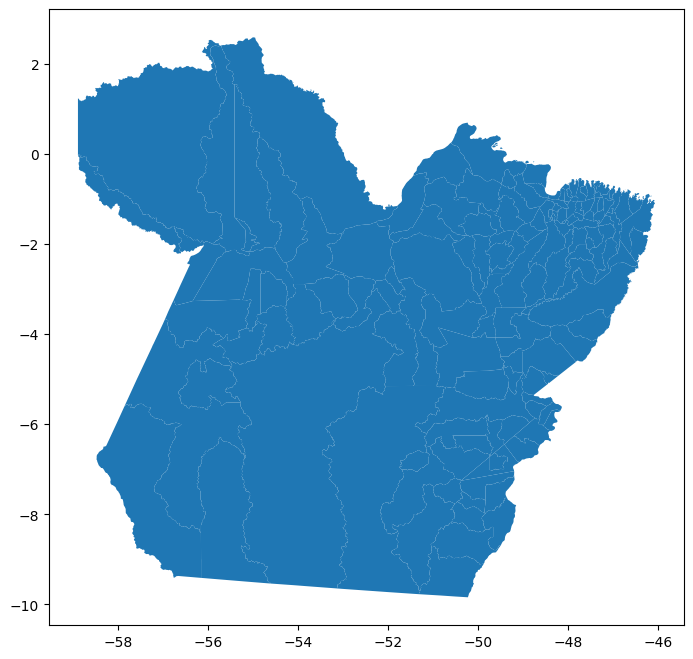

In [22]:
fig, ax =plt.subplots(figsize=(10,8))
geo_df.plot(ax = ax)
plt.show()

In [25]:
crimes_selecionados_para_df["municipios"] = crimes_selecionados_para_df["municipios"].str.upper().str.strip()
geo_df["NM_MUN"] = geo_df["NM_MUN"].str.upper().str.strip()

In [26]:
crimes_por_municipio = crimes_selecionados_para_df.groupby("municipios").size().reset_index(name="ocorrencias")

In [27]:
mapa_crimes = geo_df.merge(crimes_por_municipio, left_on="NM_MUN", right_on="municipios", how="left")
mapa_crimes["ocorrencias"] = mapa_crimes["ocorrencias"].fillna(0)  # Preencher valores nulos com zero

In [47]:
geo_df["crime_count"] = geo_df.groupby("Município_Nome")["Município_Nome"].transform("count")


In [48]:
geo_df = geo_df.merge(crimes_selecionados_para_df, how='left', left_on='NM_MUN', right_on='municipios')
geo_df.head()

MemoryError: Unable to allocate 23.8 GiB for an array with shape (3188864103,) and data type int64

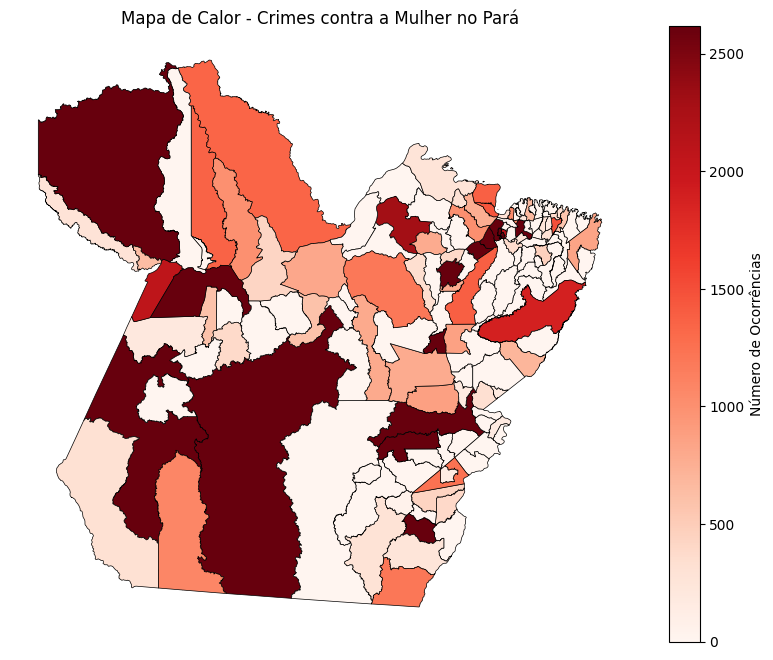

In [43]:

# Definir vmin e vmax corretamente
vmin, vmax = mapa_crimes["ocorrencias"].min(), mapa_crimes["ocorrencias"].quantile(0.9)

# Normalizar os valores para o colormap
norm = plt.Normalize(vmin=vmin, vmax=vmax)
colors = plt.cm.Reds(norm(mapa_crimes["ocorrencias"]))

# Criar o gráfico
fig, ax = plt.subplots(figsize=(10, 8))
mapa_crimes.plot(ax=ax, color=colors, edgecolor='black', linewidth=0.5)

# Adicionar a barra de cores
sm = plt.cm.ScalarMappable(cmap="Reds", norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label("Número de Ocorrências")

# Ajustes finais
ax.axis("off")
plt.title("Mapa de Calor - Crimes contra a Mulher no Pará")
plt.show()


In [40]:
top_municipios = crimes_selecionados_para_df["municipios"].value_counts().head(10)
print(top_municipios)


municipios
BELÉM          49978
ANANINDEUA     16802
SANTARÉM       10251
MARABÁ          6806
PARAUAPEBAS     5999
CASTANHAL       4966
ABAETETUBA      4166
ALTAMIRA        3829
BARCARENA       3792
ITAITUBA        3583
Name: count, dtype: int64


TypeError: '<=' not supported between instances of 'str' and 'float'

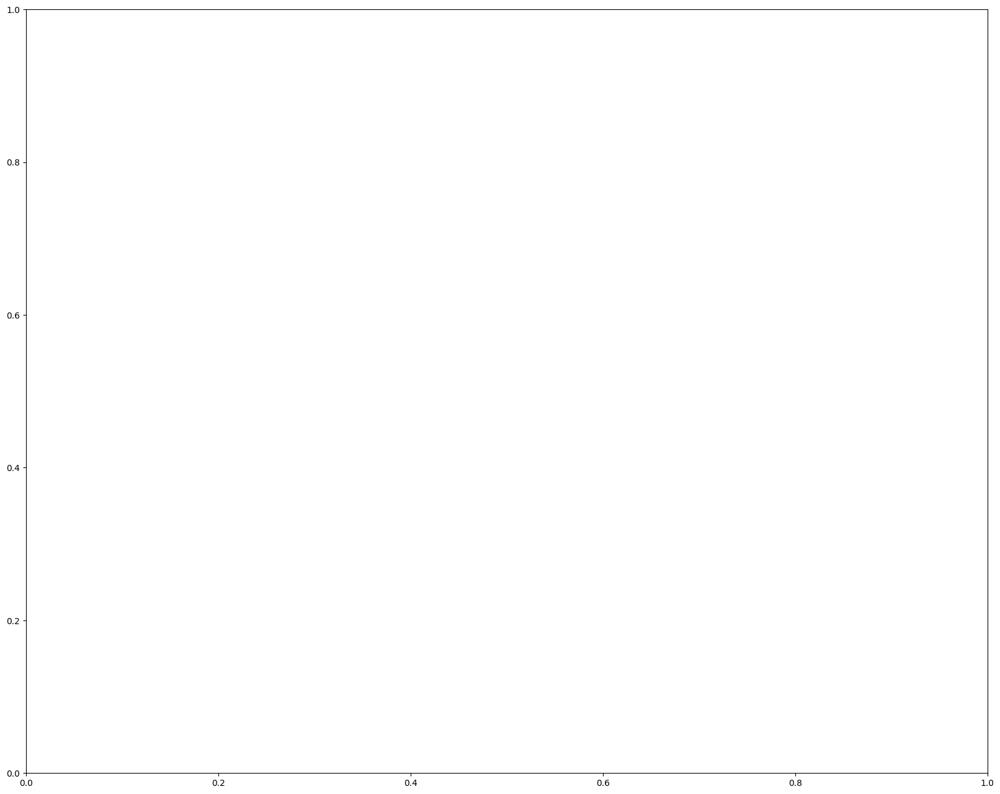

In [ ]:
fig, ax =plt.subplots(figsize=(10,8))

vmin, vmax = geo_df["municipios"].min(), geo_df["municipios"].quantile(0.99)

colors = plt.cm.Reds(geo_df['municipios'] - vmin)/(vmax - vmin)

geo_df.plot(ax = ax, color=colors,edgecolor='black', linewidth=0.1)

sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax) 
cbar.set_label('municipios')


ax.axis('off') 
plt.show 

import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
mapa_crimes.plot(column="ocorrencias", cmap="Reds", linewidth=0.8, edgecolor="black", legend=True, ax=ax)
plt.title("Mapa de Calor - Crimes contra a Mulher no Pará")
plt.show()




In [ ]:
geo_df = geo_df.merge(crimes_selecionados_para_df, how='left', left_on='NM_RGI', right_on='regionais')
geo_df.head()